In [1]:
#importing necessary libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import graphviz
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.ensemble import RandomForestClassifier
from sklearn import tree
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, roc_auc_score
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
from sklearn.feature_selection import mutual_info_classif
from sklearn.metrics import classification_report,confusion_matrix
import numpy as np
from sklearn.feature_selection import SelectKBest

/Users/jayantjalta/Documents/anaconda3/lib/python3.7/site-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)


In [2]:
df=pd.read_csv('loan_data.csv')

In [3]:
df.head()

,credit.policy,purpose,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec,not.fully.paid
0,1,debt_consolidation,0.1189,829.10,11.350407,19.48,737,5639.958333,28854,52.1,0,0,0,0
1,1,credit_card,0.1071,228.22,11.082143,14.29,707,2760.000000,33623,76.7,0,0,0,0
2,1,debt_consolidation,0.1357,366.86,10.373491,11.63,682,4710.000000,3511,25.6,1,0,0,0
3,1,debt_consolidation,0.1008,162.34,11.350407,8.10,712,2699.958333,33667,73.2,1,0,0,0
4,1,credit_card,0.1426,102.92,11.299732,14.97,667,4066.000000,4740,39.5,0,1,0,0


In [4]:
df.describe()

,credit.policy,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec,not.fully.paid
count,9578.000000,9578.000000,9578.000000,9578.000000,9578.000000,9578.000000,9578.000000,9.578000e+03,9578.000000,9578.000000,9578.000000,9578.000000,9578.000000
mean,0.804970,0.122640,319.089413,10.932117,12.606679,710.846314,4560.767197,1.691396e+04,46.799236,1.577469,0.163708,0.062122,0.160054
std,0.396245,0.026847,207.071301,0.614813,6.883970,37.970537,2496.930377,3.375619e+04,29.014417,2.200245,0.546215,0.262126,0.366676
min,0.000000,0.060000,15.670000,7.547502,0.000000,612.000000,178.958333,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,0.103900,163.770000,10.558414,7.212500,682.000000,2820.000000,3.187000e+03,22.600000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,0.122100,268.950000,10.928884,12.665000,707.000000,4139.958333,8.596000e+03,46.300000,1.000000,0.000000,0.000000,0.000000
75%,1.000000,0.140700,432.762500,11.291293,17.950000,737.000000,5730.000000,1.824950e+04,70.900000,2.000000,0.000000,0.000000,0.000000
max,1.000000,0.216400,940.140000,14.528354,29.960000,827.000000,17639.958330,1.207359e+06,119.000000,33.000000,13.000000,5.000000,1.000000


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9578 entries, 0 to 9577
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   credit.policy      9578 non-null   int64  
 1   purpose            9578 non-null   object 
 2   int.rate           9578 non-null   float64
 3   installment        9578 non-null   float64
 4   log.annual.inc     9578 non-null   float64
 5   dti                9578 non-null   float64
 6   fico               9578 non-null   int64  
 7   days.with.cr.line  9578 non-null   float64
 8   revol.bal          9578 non-null   int64  
 9   revol.util         9578 non-null   float64
 10  inq.last.6mths     9578 non-null   int64  
 11  delinq.2yrs        9578 non-null   int64  
 12  pub.rec            9578 non-null   int64  
 13  not.fully.paid     9578 non-null   int64  
dtypes: float64(6), int64(7), object(1)
memory usage: 1.0+ MB


# Preprocessing

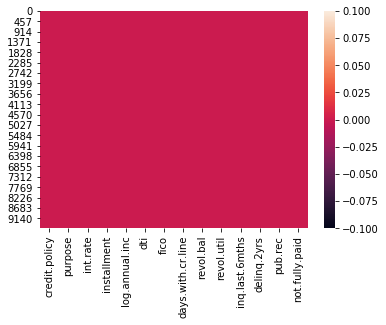

In [6]:
sns.heatmap(df.isnull())

# Exploratory Data Analysis

Plotting a historgram of two FICO distributions, one for each credit.policy outcome.

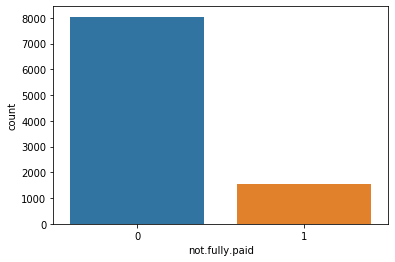

In [7]:
sns.countplot('not.fully.paid',data=df)


THE TARGET CLASS IS IMBALANCED

In [8]:
Not_paid = df[df['not.fully.paid']==1]

paid= df[df['not.fully.paid']==0]

In [9]:
print(Not_paid.shape,paid.shape)

(1533, 14) (8045, 14)


Text(0.5, 0, 'FICO')

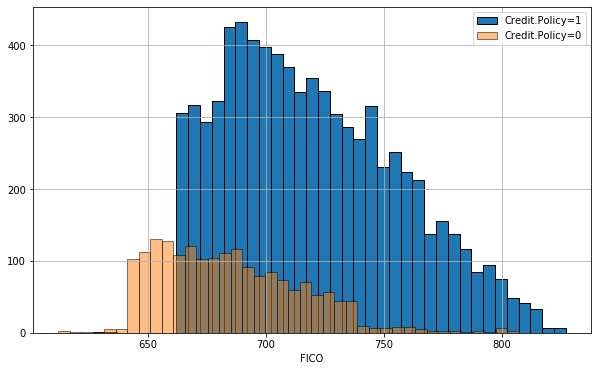

In [10]:
plt.figure(figsize=(10,6))
df[df['credit.policy']==1]['fico'].hist(bins=40,label='Credit.Policy=1',edgecolor='black')
df[df['credit.policy']==0]['fico'].hist(alpha=0.5,bins=40,label='Credit.Policy=0',edgecolor='black')
plt.legend()
plt.xlabel('FICO')




Clearly by looking at the graph we can see that it follows a logarithimic distribution with majority being the credit policy=1(meets the lending club loan criteria) and based on the fico score people having lower fico score are the ones haveing credit policy=0(they do not meet the criteria) which makes sense.


Text(0.5, 0, 'FICO')

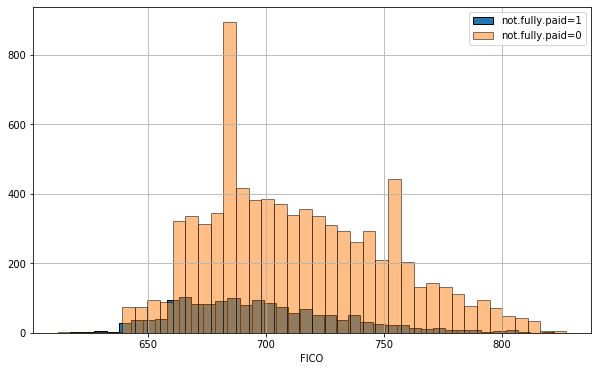

In [11]:
plt.figure(figsize=(10,6))
df[df['not.fully.paid']==1]['fico'].hist(bins=40,label='not.fully.paid=1',edgecolor='black')
df[df['not.fully.paid']==0]['fico'].hist(alpha=0.5,bins=40,label='not.fully.paid=0',edgecolor='black')
plt.legend()
plt.xlabel('FICO')

From the plot,it is seen that most of the people are paying off the loan, follows the same distribution as the previous one.
The Highest range of count lies between 675-720

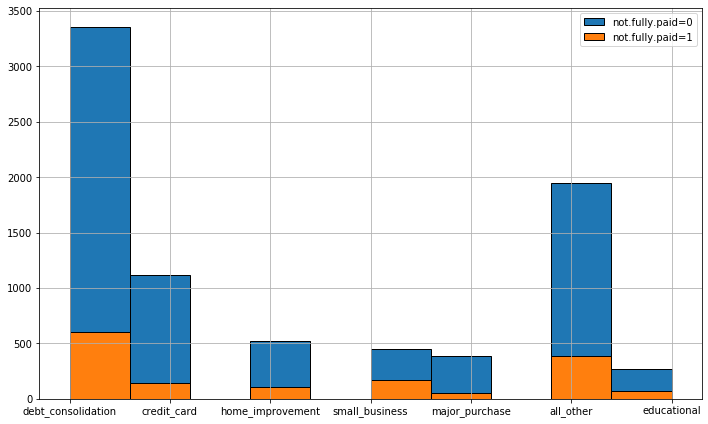

In [12]:
plt.figure(figsize=(10,6))
df[df['not.fully.paid']==0]['purpose'].hist(label='not.fully.paid=0',edgecolor='black')
df[df['not.fully.paid']==1]['purpose'].hist(label='not.fully.paid=1',edgecolor='black')
plt.legend()
plt.tight_layout()

Ratio between not fully paid and fully paid is almost same for all purposes.The highest number of loan required belong to debt consolidation.

<Figure size 576x432 with 0 Axes>

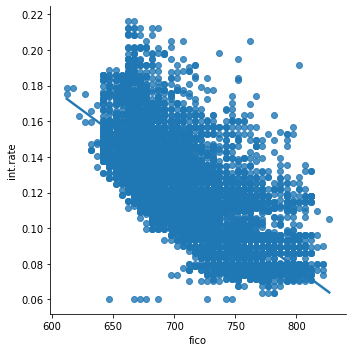

In [21]:
plt.figure(figsize=(8,6))
sns.lmplot(x='fico',y='int.rate',data=df)

From this graph one thing to note is that the interest rate drops as the fico score increases because of good credit history

# Modelling

Converting categorical variables

In [17]:
categorical=['purpose']

In [18]:
final_data=pd.get_dummies(df,columns=categorical,drop_first=True)

In [19]:
final_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9578 entries, 0 to 9577
Data columns (total 19 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   credit.policy               9578 non-null   int64  
 1   int.rate                    9578 non-null   float64
 2   installment                 9578 non-null   float64
 3   log.annual.inc              9578 non-null   float64
 4   dti                         9578 non-null   float64
 5   fico                        9578 non-null   int64  
 6   days.with.cr.line           9578 non-null   float64
 7   revol.bal                   9578 non-null   int64  
 8   revol.util                  9578 non-null   float64
 9   inq.last.6mths              9578 non-null   int64  
 10  delinq.2yrs                 9578 non-null   int64  
 11  pub.rec                     9578 non-null   int64  
 12  not.fully.paid              9578 non-null   int64  
 13  purpose_credit_card         9578 

In [20]:
columns = final_data.columns.tolist()
columns = [c for c in columns if c not in ["not.fully.paid"]]
target = "not.fully.paid"
state = np.random.RandomState(42)
X = final_data[columns]
Y = final_data[target]
print(X.shape)
print(Y.shape)

(9578, 18)
(9578,)


In [21]:
from imblearn.over_sampling import RandomOverSampler

In [22]:
os = RandomOverSampler()

In [23]:
X_train_res, y_train_res = os.fit_sample(X, Y)

In [24]:
X_train_res.shape,y_train_res.shape

((16090, 18), (16090,))

In [25]:
over_sampled_df=pd.concat([X_train_res,y_train_res],axis=1)

In [26]:
over_sampled_df

,credit.policy,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec,purpose_credit_card,purpose_debt_consolidation,purpose_educational,purpose_home_improvement,purpose_major_purchase,purpose_small_business,not.fully.paid
0,1,0.1189,829.10,11.350407,19.48,737,5639.958333,28854,52.1,0,0,0,0,1,0,0,0,0,0
1,1,0.1071,228.22,11.082143,14.29,707,2760.000000,33623,76.7,0,0,0,1,0,0,0,0,0,0
2,1,0.1357,366.86,10.373491,11.63,682,4710.000000,3511,25.6,1,0,0,0,1,0,0,0,0,0
3,1,0.1008,162.34,11.350407,8.10,712,2699.958333,33667,73.2,1,0,0,0,1,0,0,0,0,0
4,1,0.1426,102.92,11.299732,14.97,667,4066.000000,4740,39.5,0,1,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16085,1,0.1284,188.27,10.308953,2.08,687,4139.958333,3859,38.6,3,0,0,0,0,0,0,0,0,1
16086,1,0.1183,198.81,11.002100,18.82,717,5040.000000,15638,93.1,1,0,0,0,0,0,0,0,0,1
16087,1,0.1062,130.24,10.221941,5.76,707,3630.000000,4423,40.2,1,0,0,1,0,0,0,0,0,1
16088,1,0.1253,50.20,10.692036,20.75,677,4080.041667,920,21.9,0,0,0,0,0,0,0,0,0,1


Text(0.5, 1.0, 'After Oversampling')

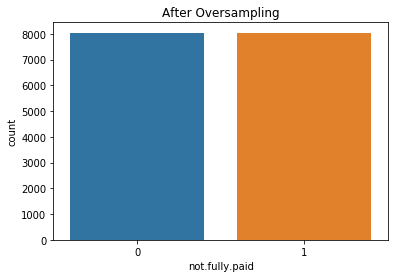

In [32]:
sns.countplot(over_sampled_df['not.fully.paid'])
plt.title('After Oversampling')


In [28]:
from sklearn.model_selection import train_test_split

Splitting the data for feature selection 

In [29]:
X=X_train_res
y=y_train_res
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

# Feature Selection using Mutual Information

In [30]:
# calculating the mutual information between the variables and the target
# the smaller the value the less information the feature has about the
mi = mutual_info_classif(X_train.fillna(0), y_train)
mi

array([1.53441758e-02, 5.36262825e-02, 2.38984788e-01, 9.51372371e-02,
       1.88821200e-01, 3.01434185e-02, 1.44023899e-01, 2.70109722e-01,
       1.17064078e-01, 2.59406552e-02, 5.51459774e-03, 0.00000000e+00,
       4.07809449e-03, 6.31418816e-03, 4.68597637e-03, 0.00000000e+00,
       1.20438467e-04, 1.04847097e-02])

In [31]:
mi = pd.Series(mi)
mi.index = X_train.columns
mi.sort_values(ascending=False)

revol.bal                     0.270110
installment                   0.238985
dti                           0.188821
days.with.cr.line             0.144024
revol.util                    0.117064
log.annual.inc                0.095137
int.rate                      0.053626
fico                          0.030143
inq.last.6mths                0.025941
credit.policy                 0.015344
purpose_small_business        0.010485
purpose_debt_consolidation    0.006314
delinq.2yrs                   0.005515
purpose_educational           0.004686
purpose_credit_card           0.004078
purpose_major_purchase        0.000120
pub.rec                       0.000000
purpose_home_improvement      0.000000
dtype: float64

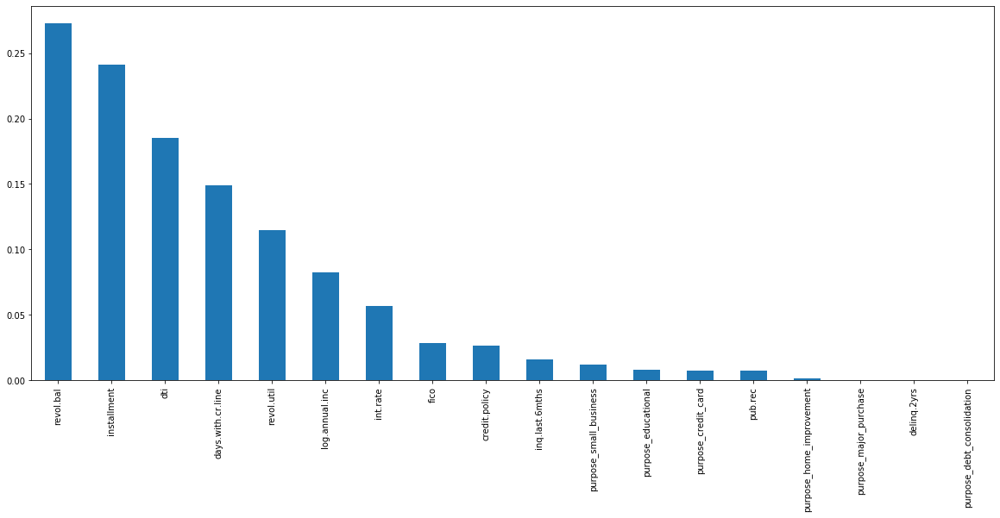

In [229]:
mi.sort_values(ascending=False).plot.bar(figsize=(20, 8))

Comparatively, we can see that there are a few features (left of the plot) that seem to contribute the most to predicting the target.There are also a few features with almost zero MI values on the right of the plot.

Where to put the cut-off to select features is arbitrary. One could choose a certain value of MI after studying the plot above. An alternative and most frequent way of selecting features is to select the top 10, or top 20 features, or the features in the the top 10th percentile of the MI value distribution.

To do this, I will use mutual info in combination with SelectKBest or SelectPercentile from sklearn. SelectKBest allows to determine how many features, and SelectPercentile the features within a certain percentile. 

In [230]:
#top 10 features


sel_ = SelectKBest(mutual_info_classif, k=10).fit(X_train.fillna(0), y_train)
X_train.columns[sel_.get_support()]

Index(['credit.policy', 'int.rate', 'installment', 'log.annual.inc', 'dti',
       'fico', 'days.with.cr.line', 'revol.bal', 'revol.util',
       'inq.last.6mths'],
      dtype='object')

# Splitting after Feature Selection 

In [256]:
X=over_sampled_df[['credit.policy', 'int.rate', 'installment', 'log.annual.inc', 'dti',
       'fico', 'days.with.cr.line', 'revol.bal', 'revol.util',
       'inq.last.6mths']]
y=over_sampled_df['not.fully.paid']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

# Logistic Regression

In [238]:
from sklearn.linear_model import LogisticRegression

In [239]:
Log=LogisticRegression()

In [240]:
Model_log=Log.fit(X_train,y_train)

In [241]:
prediction_log=Model_log.predict(X_test)

In [242]:
print(classification_report(y_test,prediction_log))
print(confusion_matrix(y_test,prediction_log))

              precision    recall  f1-score   support

           0       0.55      0.59      0.57      2380
           1       0.58      0.53      0.55      2447

    accuracy                           0.56      4827
   macro avg       0.56      0.56      0.56      4827
weighted avg       0.56      0.56      0.56      4827

[[1415  965]
 [1141 1306]]


# Decision Tree

In [243]:
tree=DecisionTreeClassifier()

In [244]:
Model=tree.fit(X_train,y_train)

In [245]:
Model

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [246]:
features=list(X.columns)
class_name = list(y_train.unique())


In [247]:
predictions=Model.predict(X_test)

In [248]:
from sklearn.metrics import classification_report,confusion_matrix

In [249]:
print(classification_report(y_test,predictions))
print(confusion_matrix(y_test,predictions))

              precision    recall  f1-score   support

           0       0.97      0.80      0.88      2380
           1       0.84      0.98      0.90      2447

    accuracy                           0.89      4827
   macro avg       0.90      0.89      0.89      4827
weighted avg       0.90      0.89      0.89      4827

[[1911  469]
 [  58 2389]]


In [211]:
# create a dot_file which stores the tree structure
dot_data = export_graphviz(tree,feature_names = features,rounded = True,filled = True)
# Draw graph
graph = pydotplus.graph_from_dot_data(dot_data)  
graph.write_png("Tree.png")
# Show graph
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.514396 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.514396 to fit



Accuracy = 89%

# Random Forest

In [250]:
Random=RandomForestClassifier(n_estimators=100)

In [251]:
model_3=Random.fit(X_train,y_train)

In [252]:
predictions_3=model_3.predict(X_test)

In [253]:
print(classification_report(y_test,predictions_3))
print(confusion_matrix(y_test,predictions_3))

              precision    recall  f1-score   support

           0       0.97      0.96      0.97      2380
           1       0.96      0.97      0.97      2447

    accuracy                           0.97      4827
   macro avg       0.97      0.97      0.97      4827
weighted avg       0.97      0.97      0.97      4827

[[2287   93]
 [  68 2379]]
